**Real or Spurious: Pulsar Candidate Classification through KNN Classification**
==========

Introduction
=====

Background
---

Pulsars are a unique type of rotating Neutron stars. They emit beams of radiation when periodically rotating, while the emission beams can be observed on Earth and detected in a pattern of broadband radio admission. They are called probes of spacetime, the interstellar medium, and the state of matter. Large radio telescopes are used to collect periodic radio signals emitting from Pulsars during their periodic repeat rotations. Any signal detected from a potential pulsar is a “candidate”. For any potential pulsar that truely emits the candidate would be characterized as “real” and classified as a “positive example”. On the other hand, the pulsar that does not actually emit the candidate would be characterized as “spurious” (the mismatch of the pulsars and the candidate can be caused by radio frequency interference or noise) and classified as a “negative example”. 

Question
---
In our project, we tried to answer the question: **When given a new pulsar candidate, would the candidate be characterized as a real pulsar or a spurious pulsar?** We used the data set Sonar data (citation) for pulsar determination using the KNN classification from Lyon (2016). Specific features are selected to investigate if the candidate is believed to be the newly discovered pulsar or not (Shan et al., 2015). In this case, we chose the Skewness and Excess of Kurtosis as the prediction factors, as a potential pulsar should be classified depending on evaluation values on these two factors (Wang et al., 2019). Such features have also been selected for the Pulsar classification in previous study (Wang et al., 2019).

Let's begin by loading in our libraries:

In [1]:
# Loading libraries
library(tidyverse) # Basic functions for our analysis
library(RColorBrewer) # Color scheme
library(repr) # For visualization
library(tidymodels) # For our models
library(shiny) # For adding titles in tables
install.packages("kknn") # For our classification model

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

Dataset
----

The data set we will be using is called "Sonar Data" from Lyon (2016).  


Here is a short description of what each variable represents:
* mean_ip: the mean of the integrated profile
* sd_ip: standard deviation of the integrated profile
* kuritosis_ip : excess kurtosis of the integrated profile.
* skew_ip: skewness of the integrated profile.
* mean_dmsnr: mean of DM-SMR curve
* sd_dmsmr: standard deviation of the DM-SMR curve
* kurtosis_dmsnr: excess kurtosis of the DM-SNR curve
* skew_dmsnr: skewness of the DM-SNR curve 


Now let's read the Pulsar Star dataset from our GitHub URL. Because the dataset does not have column names, we are renaming the columns following the conventions from the dataset description. We will also use the `mutate` function so the variable that we are trying to predict, `pulsar`, is in factor format. Then, we cleanly visualize the first and last 6 entries of our dataset.

In [2]:
# Reading, renaming and mutating to factor format (pulsar), tidying
star_data <- read_csv("https://raw.githubusercontent.com/luigivicencio/dsci100-003-008/main/HTRU_2.csv", 
                      col_names = FALSE) |> # Reading the dataset
    rename("mean_ip" = X1, "sd_ip" = X2, "kurtosis_ip" = X3, 
           "skew_ip" = X4, "mean_dmsnr" = X5, "sd_dmsnr" = X6, 
           "kurtosis_dmsnr" = X7, "skew_dmsnr" = X8, "pulsar" = X9)|> # Renaming the columns
    mutate(pulsar = as_factor(pulsar)) |> # Mutating to factor format
    mutate(pulsar = fct_recode(pulsar,"No" = "0", "Yes" = "1")) # Making it easier to manipulate the variable


h3("Table 1: First 6 entries of Pulsar Star dataset") # Naming our first table
head(star_data) # Viewing our first table
h3("Table 2: Last 6 entries of Pulsar Star dataset") # Naming our second table
tail(star_data) # Viewing our second table

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Shiny tags cannot be represented in plain text (need html)

mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,No
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,No
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,No
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,No
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,No
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,No


Shiny tags cannot be represented in plain text (need html)

mean_ip,sd_ip,kurtosis_ip,skew_ip,mean_dmsnr,sd_dmsnr,kurtosis_dmsnr,skew_dmsnr,pulsar
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
96.0000,44.19311,0.3886740,0.28134362,1.871237,15.83375,9.634927,104.821623,No
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,No
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,No
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,No
114.5078,53.90240,0.2011614,-0.02478884,1.946488,13.38173,10.007967,134.238910,No
57.0625,85.79734,1.4063910,0.08951971,188.306020,64.71256,-1.597527,1.429475,No


Methods & Results:
===

Pre-Analysis
-----

For our pre-analysis, we will split the dataset into two subdatasets (training and testing) with a proportion of 75% to use as our training set. Once we have the training set, we will center and scale our predictor variables and then create a summary table.

In [3]:
set.seed(1010)

# Splitting the dataset into training and testing subgroups (where 75% of the data will be used as the training set)
star_split <- initial_split(star_data, prop = 0.75, strata = pulsar)  
star_train <- training(star_split)   
star_test <- testing(star_split)

# Creating a recipe, scaling, centering, and baking
star_recipe1 <- recipe(pulsar ~ ., data = star_train) |>
    step_scale(all_predictors()) |>
    step_center(all_predictors()) |>
    prep()

scaled_star <- bake(star_recipe1, star_train)

# Creating a summary table grouped by our classification
star_table <- group_by(scaled_star, pulsar) |>
    summarize(count = n(),
             missing_values = sum(is.na(scaled_star)), # check that
             mean_mean_ip = mean(mean_ip), # check that
             mean_sd_ip = mean(sd_ip),
             mean_skew_ip = mean(skew_ip),
             mean_kurtosis_ip = mean(kurtosis_ip),
             mean_mean_dmsnr = mean(mean_dmsnr),
             mean_sd_dmsnr = mean(sd_dmsnr),
             mean_skew_dmsnr = mean(skew_dmsnr),
             mean_kurtosis_dmsnr = mean(kurtosis_dmsnr))

h3("Table 3: Summary of training set")
star_table

Shiny tags cannot be represented in plain text (need html)

pulsar,count,missing_values,mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<fct>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
No,12199,0,0.2124711,0.1156343,-0.2238643,-0.2497242,-0.1257689,-0.1555325,0.08199895,0.1234337
Yes,1224,0,-2.1175940,-1.1524696,2.2311439,2.4888771,1.2534763,1.5501153,-0.81724280,-1.2302023


We have calculated the mean of all statistics parameters for each star category. Also, we should highlight that in our data, there are no missing values. Now that we have a summary table, we can decide which variables to use in building our model. To find and prove the most optimal variables to use, we can determine the two predictors with the greatest mathematical mean difference between each classification. We are only using two predictors because we believe that it is going to be a more efficient and reproducible method than choosing 3 or more predictors.

In [4]:
# Creating our first row difference table
t1 <- star_table |>
    select(-count, -missing_values, -pulsar) |>
    tail(-1)

# Creating our second row difference table
t2 <- star_table |>
    select(-count, -missing_values, -pulsar) |>
    head(-1)

# Computing the absolute difference between observation in the column
h3("Table 4: Absolute difference between spurious and pulsar stars")
abs(t1 - t2)

Shiny tags cannot be represented in plain text (need html)

mean_mean_ip,mean_sd_ip,mean_skew_ip,mean_kurtosis_ip,mean_mean_dmsnr,mean_sd_dmsnr,mean_skew_dmsnr,mean_kurtosis_dmsnr
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2.330065,1.268104,2.455008,2.738601,1.379245,1.705648,0.8992418,1.353636


As we can see, the two variables with the most significant difference are `skew_ip`, and `kurtosis_ip`. Therefore, we will use these two variables to continue to build our model. It makes sense to only choose the Integrated Profile versions (i.e. `skew_ip`) rather than the DM-SNR curve versions (i.e. `kew_dmsnr`) of each variable because the difference between the averages for the two classifications is not as significant. This way, we get a cleaner and more decisive statistical model.

Using our scaled data from the training set, we can now generate a scatterplot of our two predictors: skewness of the integrated profile (`skew_ip`) and excess kurtosis of the integrated profile (`kurtosis_ip`). We will also apply a color scheme to label if the observation is pulsar or not pulsar.

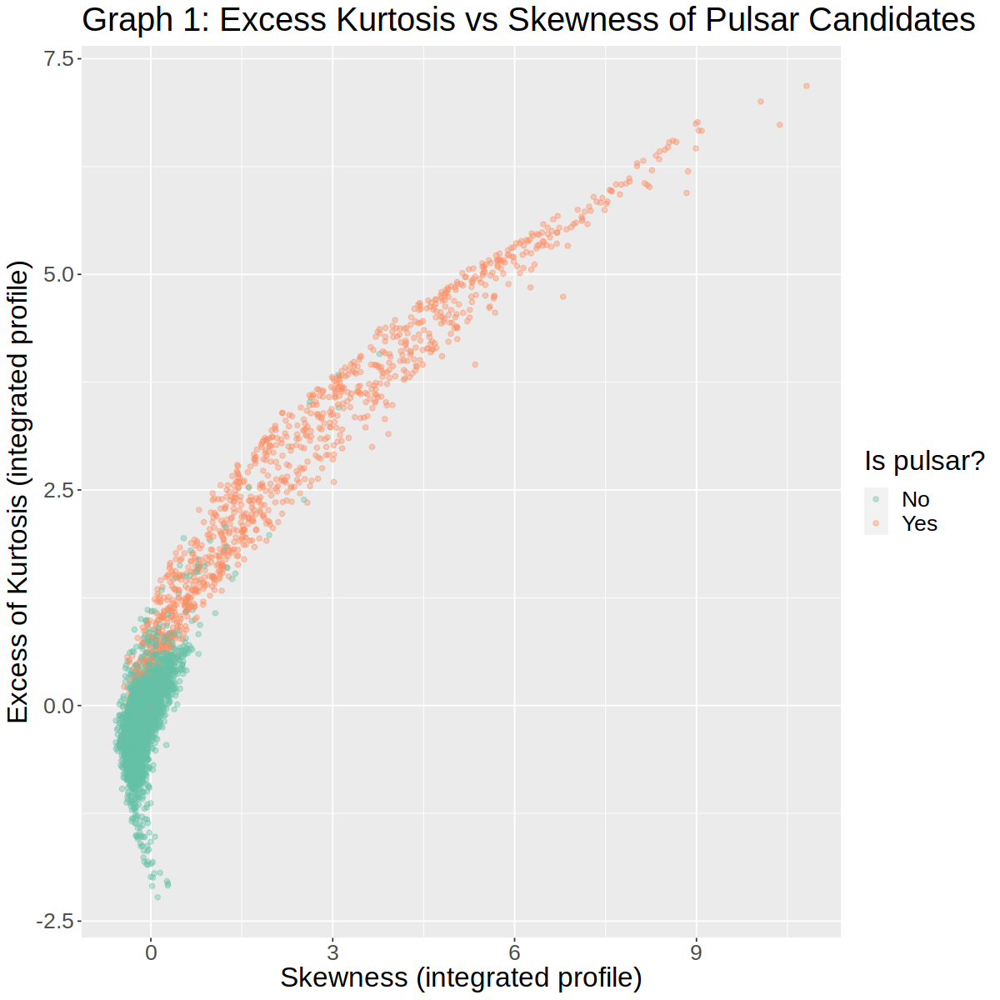

In [5]:
# Creating an initial plot to visualize the datab
options(repr.plot.width = 10, repr.plot.height = 10)

star_plot_skew <- ggplot (scaled_star, aes(x = skew_ip, y = kurtosis_ip, color = pulsar)) +
                geom_point(alpha = 0.4) +
                labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
                ggtitle("Graph 1: Excess Kurtosis vs Skewness of Pulsar Candidates") +
                theme(text = element_text(size = 20)) + 
                scale_color_brewer(palette = "Set2")
star_plot_skew        

We can see that there is a positive and somewhat strong relationship between skewness and excess of kurtosis. The group of spurious stars is more concentrated around 0 of skewness and kurtosis. As kurtosis and skewness increase, there are more pulsar stars. Therefore, kurtosis and skewness may be indeed a good metric to classify pulsar stars.

Data Analysis
-----

Now that we have a scatterplot of our two predictor variables, we can see a clear difference between the two categories. Let's move ahead with determining the optimal number of neighbors by tuning the model, creating a reipe, and cross-referencing the training data to see which number of K nearest-neighbors to use:

In [6]:
set.seed(1010)

# Setting the model to Nearest Neighbors
knn_tune <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
       set_engine("kknn") |>
       set_mode("classification")

# Creating a recipe and scaling/centering the data
star_recipe <- recipe(pulsar ~ kurtosis_ip + skew_ip, data = star_train) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

# Creating a stratified variable k-fold cross-validator
star_vfold <- vfold_cv(star_train, v = 5, strata = pulsar)
k_vals <- tibble(neighbors = seq(from = 1, to = 30, by = 1))

# Creating a workflow to compute the accuracy of the cross-validated model(s)
knn_results <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_tune) |>
    tune_grid(resamples = star_vfold, grid = k_vals) |>
    collect_metrics() |>
    filter(.metric == "accuracy")

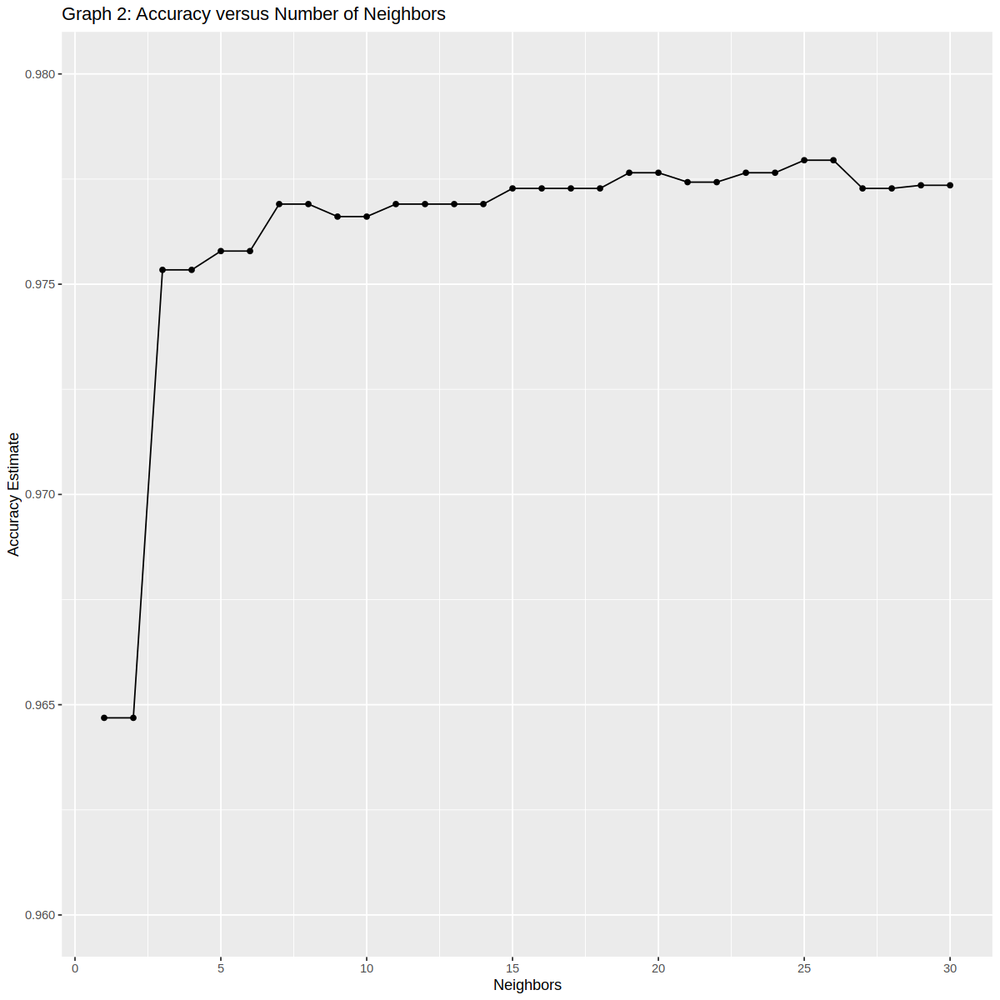

In [7]:
# Creating a visualization of each K versus its corresponding accuracy in the training set
accuracy_versus_k <- ggplot(knn_results, aes(x = neighbors, y = mean))+
        geom_point() +
        geom_line() +
        ggtitle("Graph 2: Accuracy versus Number of Neighbors") +
        labs(x = "Neighbors", y = "Accuracy Estimate") +
        scale_x_continuous(breaks = seq(0, 30, by = 5)) + 
        scale_y_continuous(limits = c(0.96, 0.98))

accuracy_versus_k

We can see in the graph above that the number of neighbors that yields the highest accuracy is around 25.

In [8]:
# Now, we can select the optimal K value for our model by filtering for the maximum value in the mean column:
h3("Table 5: Optimal K-values")
knn_results |>
    slice_max(mean)

Shiny tags cannot be represented in plain text (need html)

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
25,accuracy,binary,0.9779484,5,0.001370429,Preprocessor1_Model25
26,accuracy,binary,0.9779484,5,0.001370429,Preprocessor1_Model26


As we can see, choosing a K value of either 25 or 26 will give us identical prediction accuracy. For the purposes of our model, we will choose 25 as our K value. Now, let's go ahead and build the training model, using our newfound optimal K value:

In [9]:
# Creating the model specification
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 25) |>
       set_engine("kknn") |>
       set_mode("classification")

# Creating the workflow
knn_fit <- workflow() |>
    add_recipe(star_recipe) |>
    add_model(knn_spec) |>
    fit(data = star_train)

# Testing the accuracy of our model in testing set
star_test_predictions <- predict(knn_fit, star_test) |>
  bind_cols(star_test) |>
  metrics(truth = pulsar, estimate = .pred_class) |>
  filter(.metric == "accuracy")

h3("Table 6: Accuracy of model in testing set")
star_test_predictions

Shiny tags cannot be represented in plain text (need html)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9792179


Looking at the table output, our model has a very high accuracy of approximately 98%. This is more than good enough, and we are now ready to move on to our data visualization:

Visualization
-----

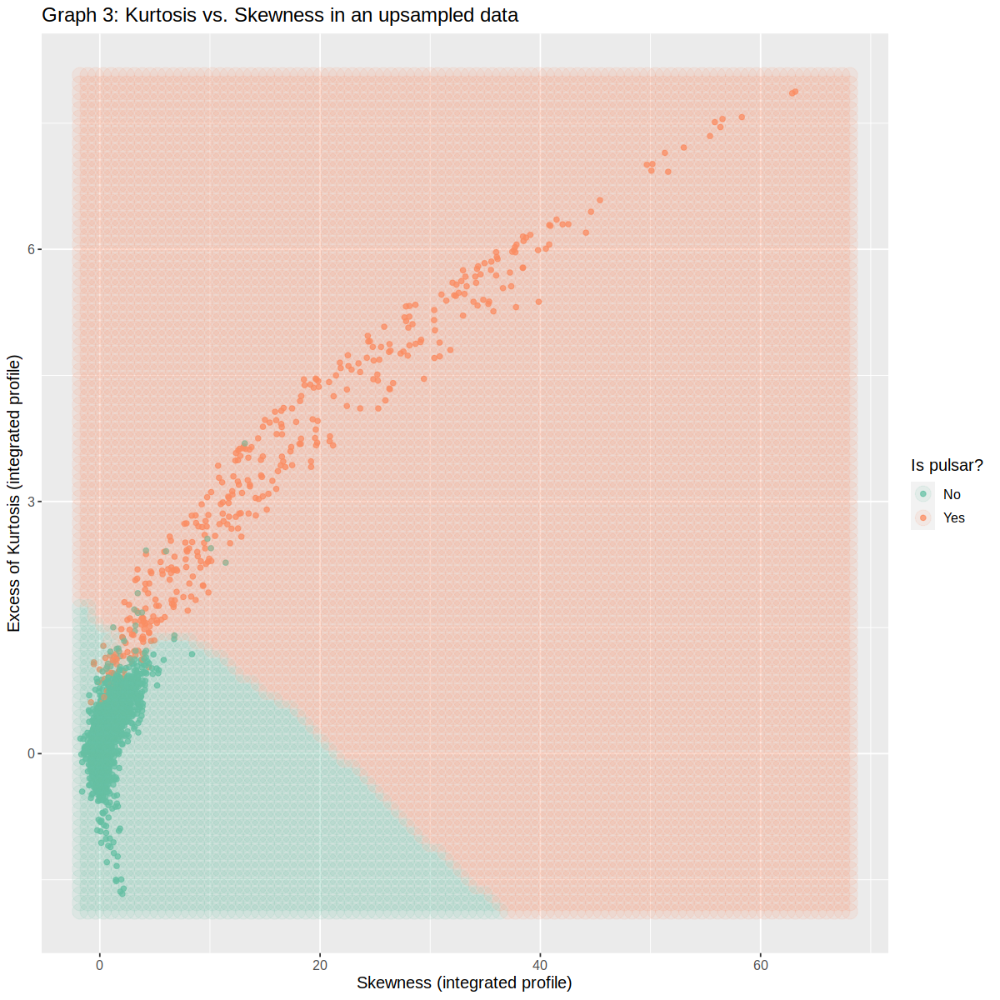

In [10]:
# Creating the grid of skwewness and kurtosis values (upsampled data)
skew_grid <- seq(min(star_data$skew_ip), 
                max(star_data$skew_ip), 
                length.out = 100)
kurtosis_grid <- seq(min(star_data$kurtosis_ip), 
                max(star_data$kurtosis_ip), 
                length.out = 100)
asgrid <- as_tibble(expand.grid(skew_ip = skew_grid, 
                                kurtosis_ip = kurtosis_grid))

# Make predictions at the grid points
knnPredGrid <- predict(knn_fit, asgrid)

# Predictions as a new column with the grid points
prediction_table <- bind_cols(knnPredGrid, asgrid) |> 
  rename(pulsar = .pred_class)

# Plotting the coloured scatterplot of the test set, and then the faded coloured background for the upsampled data
workflow_plot <-
  ggplot() +
  geom_point(data = star_test, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.75) +
  geom_point(data = prediction_table, 
             mapping = aes(x = skew_ip, 
                           y = kurtosis_ip, 
                           color = pulsar), 
             alpha = 0.1, 
             size = 5) +
  labs(y = "Excess of Kurtosis (integrated profile)", x = "Skewness (integrated profile)", color = "Is pulsar?") + 
  scale_color_brewer(palette = "Set2") +
  theme(text = element_text(size = 12)) +
  ggtitle("Graph 3: Kurtosis vs. Skewness in an upsampled data")



workflow_plot

With this graph, we can visually predict any new observation. Because of our 98% accuracy rate, we can say with a high level of confidence that our category prediction will be correct. We can see also that decision of the classifier is very accurate by the background shaded that represents the upsampled data.

Not only can we use this model for visual predictions and classifications, but our can also compute a category prediction based on user input.

Discussion
=====

Summary of Findings
-----
By tuning our model, we found that K = 25 neighbors yielded the highest possible model accuracy. Then, we used K = 25 in our model and applied it to the testing set which gave us an accuracy of 0.98. Graph 3 (`workflow_plot`) shows that there is a strong positive relationship between `skew_ip` and `kurtosis_ip`. The faded background colour shows the model's prospective predictions for any data point. Looking at which points fall correctly under our model's prediction, we can observe that the model is extremely effective. 

For true pulsar stars, when `skew_ip` increases, there is also an increase in `kurtosis_ip`. However, there seems to be a weak relationship between the `skew_ip` and the `kurtosis_ip` for spurious pulsars. There is almost no change in the `skew_ip` (which stays relatively close to zero) and the `kurtosis_ip` is generally negative between 0 and -2.5. Only some outliers of the “spurious pulsar” showed a positive relationship between `skew_ip` and the `kurtosis_ip`.



What Did we Expect to Find?
-----
Each pulsar produces a slightly different emission pattern, which varies based on the integrated profile and DM-SNR curve. Thus, a potential signal detection known as a 'candidate', is averaged over many rotations of the pulsar, as determined by the length of an observation. In the absence of additional info, each candidate could potentially describe a real pulsar. In the data frame, the candidate is sorted as a pulsar or not a pulsar.

In our proposal, we expected that a pulsar star tends to have a lower `mean_ip`, higher `skew_ip` and `kurtosis_ip` (according to the summary table). A spurious pulsar star should have higher `mean_ip`, and lower `skew_ip` and `kurtosis_ip`. With our data analysis, we see that indeed pulsar stars tend to have higher `skew_ip` and `kurtosis_ip` according to our Graph 3. Also, we expected that `skew_ip` and `kurtosis_ip` would be good predictors, and we have just found that they are good (accuracy of 98%).  



What Impact Could Such Findings Have?
-----

We can easily figure out if any new observation is pulsar or not based on the early experiences and other observation’s data. While doing the work, this model also helps make the data more readable and visible. In summary, this model can help astronomers predict if any new observation is a pulsar through a clean, accurate, and easy-to-follow data science analysis.


What Future Questions Could this Lead to?
-----

Our classification analysis contributes to predicting and identifying real pulsars. Future research can be done to investigate the prediction accuracy of the model by adding more prediction factors (such as including the `kurtosis_dmsnr` and `skew_dmsnr`) . Furthermore, more studies can be done to investigate how other prediction factors (other than `skew_ip` and `kurtosis_ip`) might alter the prediction accuracy when performing KNN classification. 




References
=====

Lyon, R. (2016). Predicting pulsar star [Data set]. Retrieved from https://www.kaggle.com/datasets/colearninglounge/predicting-pulsar-starintermediate/data

Shan, H., Wang, X., Chen, X., Yuan, J., Nie, J., Zhang, H., Liu, N., & Wang, N. (2015). Wavelet based recognition for pulsar signals. _Astronomy and Computing, 11_, 55-63. https://doi.org/10.1016/j.ascom.2015.03.003

Wang, Y., Pan, Z., Zheng, J., Qian, L., & Li, M. (2019). A hybrid ensemble method for pulsar candidate classification. _Astrophysics and Space Science, 364_(8), 1-13. https://doi.org/10.1007/s10509-019-3602-4
